# Creating word clouds of various shapes
> Awesome summary

- toc: true
- branch: master
- badges: true
- comments: true
- author: Hamel Husain & Jeremy Howard
- categories: [fastpages, jupyter]

## Introduction

World clouds are the visual representation of text data of text data, typically used to depict keyword metadata on websites, or to visualize free form text. Google says a word cloud is “an image composed of words used in a particular text or subject, in which the size of each word indicates its frequency or importance.”

The more often a specific words appears in your text, the bigger and bolder it appears in your word cloud. This article will show how to create default world cloud and diferrent shapes of world cloud to make it more interesting.

## Install the dependencies 

In [ ]:
!pip install wordcloud --quiet
!pip install stop_words --quiet

In [175]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from nltk import sent_tokenize, word_tokenize
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from nltk.tokenize import RegexpTokenizer
from stop_words import get_stop_words
import re
from PIL import Image

In [176]:
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/shridhar/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/shridhar/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Data

The data contains google news notifications extracted from dataset. The sentimental analysis has been performed on this dataset using EmPushy docker preprocessing image, 1 being postive and -1 being negative sentiments. Let's import the dataset and see few rows of data.

In [188]:
data = pd.read_csv('google_news_dataset_up.csv')

In [201]:
data.head()

,title,content,text,enticement,Setiment_overall
0,"Girl, 14, in critical condition after being re...",A helicopter winchman has pulled a teenage gir...,A helicopter winchman has pulled a teenage gir...,0.948923,1
1,New rugby tackle and kick rules set to be tria...,World Rugby's Law Review Group has recommended...,World Rugby's Law Review Group has recommended...,0.999889,1
2,Willie Frazer dead: Victims' campaigner in Nor...,Willie Frazer has lost his fight for life. His...,Willie Frazer dead: Victims' campaigner in Nor...,0.000318,-1
3,Oberstown reduced use of single separation by ...,Oberstown reduced its use of single separation...,Oberstown reduced use of single separation by ...,0.061061,-1
4,Wilfried Zaha 'urges Crystal Palace to allow h...,Wifried Zaha has pleaded with Crystal Palace t...,Wifried Zaha has pleaded with Crystal Palace t...,0.110220,1


## Preprocessing of text field

As we are crating word cloud, we nee to preprocess the text field by removing stopwords, numbers, duplicates and words with character length less than 2. To do so we make use of nltk library stopwords and punctuation.

In [202]:
data_positive = data[data['Setiment_overall']==1]
data_negative = data[data['Setiment_overall']==-1]

In [204]:
def clean_data(data):
    top_N = 100
    #convert list of list into text
    #a=''.join(str(r) for v in df_usa['title'] for r in v)

    a = data['title'].str.lower().str.cat(sep=' ')

    # removes punctuation,numbers and returns list of words
    b = re.sub('[^A-Za-z]+', ' ', a)

    #remove all the stopwords from the text
    stop_words = list(get_stop_words('en'))         
    nltk_words = list(stopwords.words('english'))   
    stop_words.extend(nltk_words)

    word_tokens = word_tokenize(b)
    filtered_sentence = [w for w in word_tokens if not w in stop_words]
    filtered_sentence = []
    for w in word_tokens:
        if w not in stop_words:
            filtered_sentence.append(w)

    # Remove characters which have length less than 2  
    without_single_chr = [word for word in filtered_sentence if len(word) > 2]

    # Remove numbers
    cleaned_data_title = [word for word in without_single_chr if not word.isnumeric()]
    
    return cleaned_data_title

## Top frequent words positive sentences

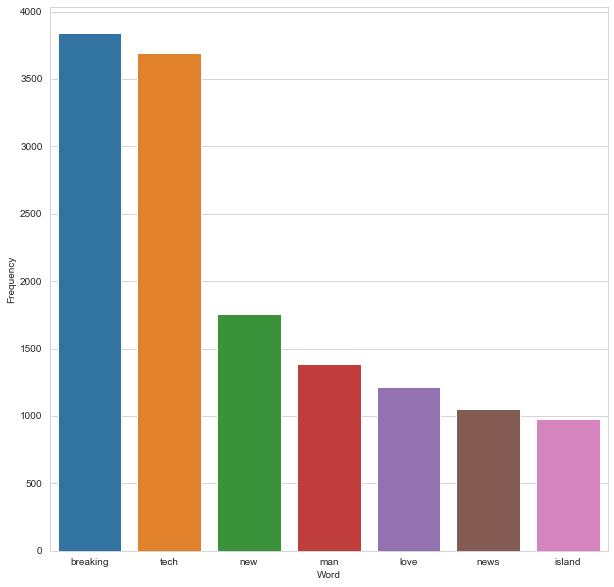

In [208]:
cleaned_data_title_pos = clean_data(data_positive)
# Calculate frequency distribution
word_dist = nltk.FreqDist(cleaned_data_title_pos)
rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency'])

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.barplot(x="Word",y="Frequency", data=rslt.head(7))

### Top frequent words negative sentences

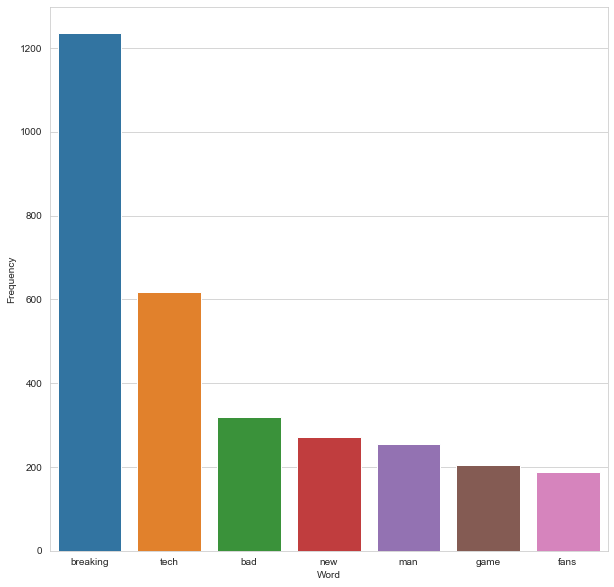

In [209]:
cleaned_data_title_neg = clean_data(data_negative)
# Calculate frequency distribution
word_dist = nltk.FreqDist(cleaned_data_title_neg)
rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency'])

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.barplot(x="Word",y="Frequency", data=rslt.head(7))

## Create a function to plot the wordcloud

In [210]:
def wc(data,bgcolor,title, mask):
    plt.figure(figsize = (50,50))
    wc = WordCloud(width = 3000, height = 2000,background_color = bgcolor, max_words = 500,  max_font_size = 100,
                   colormap='rainbow',stopwords=STOPWORDS,mask=mask)
    wc.generate(' '.join(data))
    plt.imshow(wc)
    plt.axis('off')

## Word cloud without mask

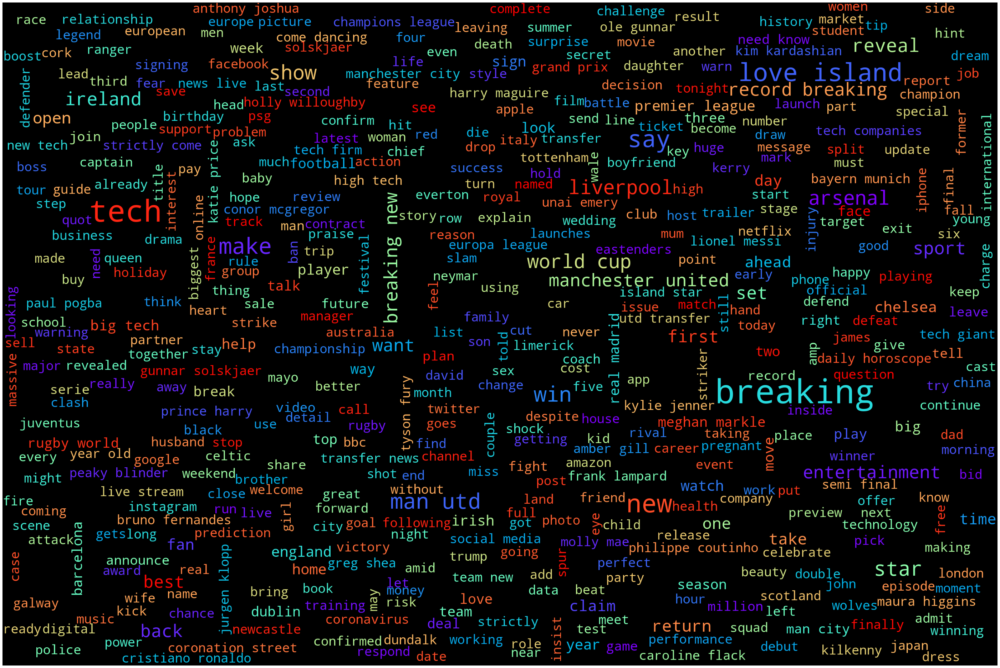

In [212]:
wc(cleaned_data_title_pos,'black','Frequent Words',mask=None )

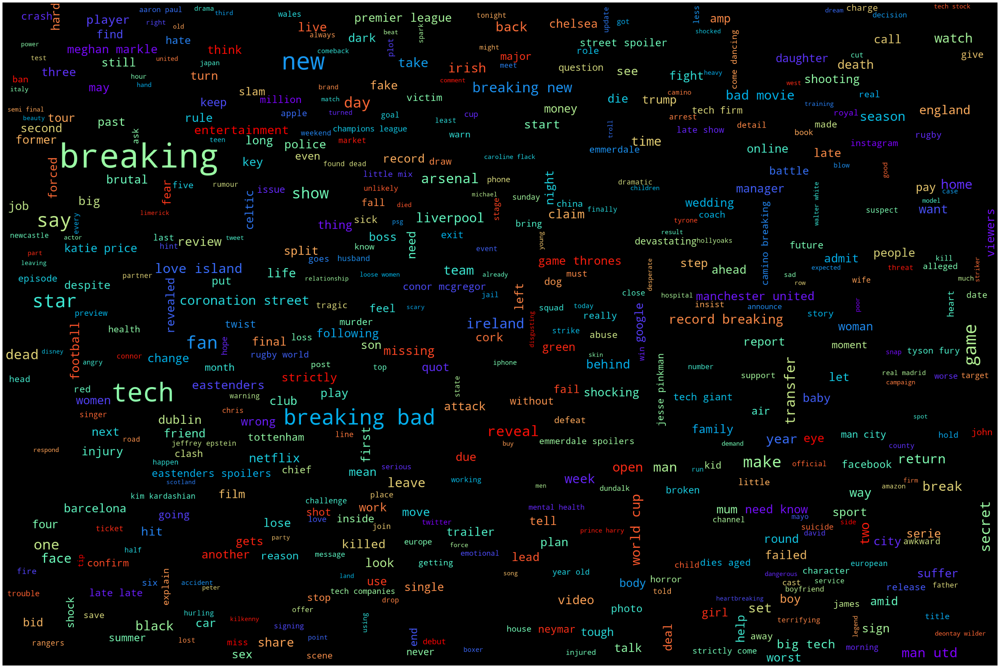

In [211]:
wc(cleaned_data_title_neg,'black','Frequent Words',mask=None )

## Word cloud with mask

Masks are the shapes used to create a word cloud. Mask should be white background and anyone can download from google. Here I have downloaded thumbsup and thumbs down mask to show positive and negative words used in the text.

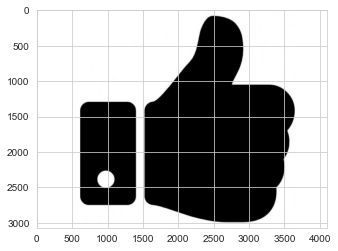

In [218]:
img = Image.open('upvote_up.png')
img.resize((20, 20), Image.ANTIALIAS)
plt.imshow(img)

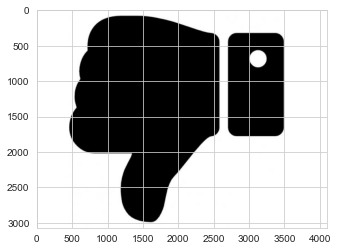

In [220]:
img = Image.open('downvote_up.png')
img.resize((20, 20), Image.ANTIALIAS)
plt.imshow(img)

Now call the function wc created before and send mask as an argument as I have already created function to facilitate the mask.

### Negative sentiment using thumbs down mask

In [221]:
mask_pos = np.array(Image.open('upvote_up.png'))

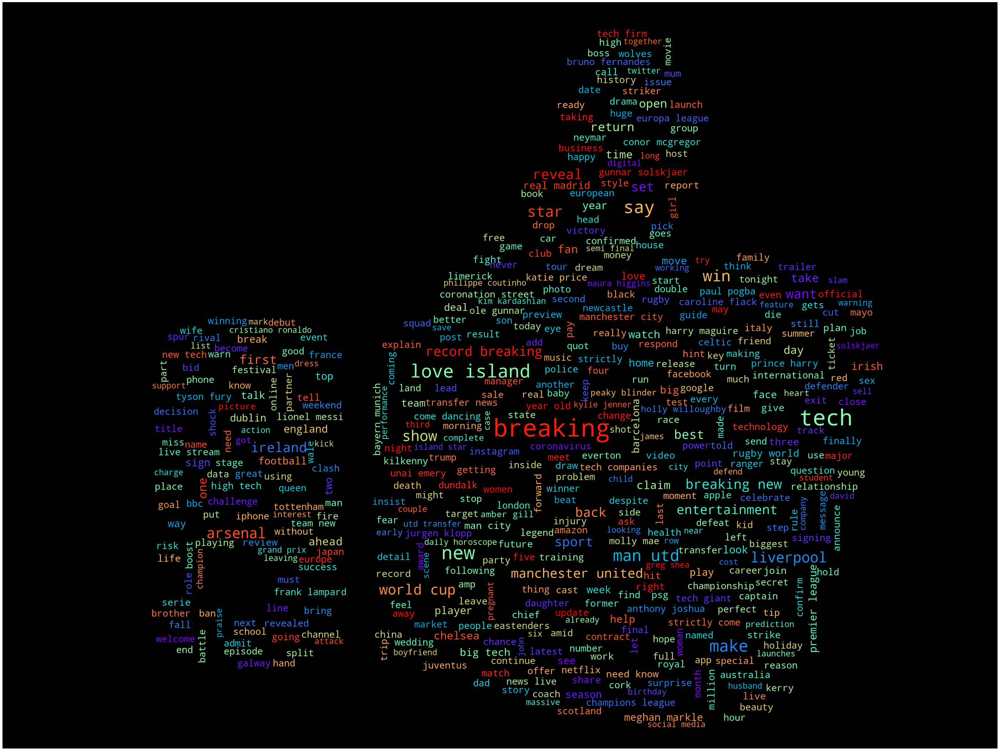

In [227]:
wc(cleaned_data_title_pos,'black','Common Words', mask_pos)

### Negative sentiment using thumbs down mask

In [228]:
mask_neg = np.array(Image.open('downvote_up.png'))

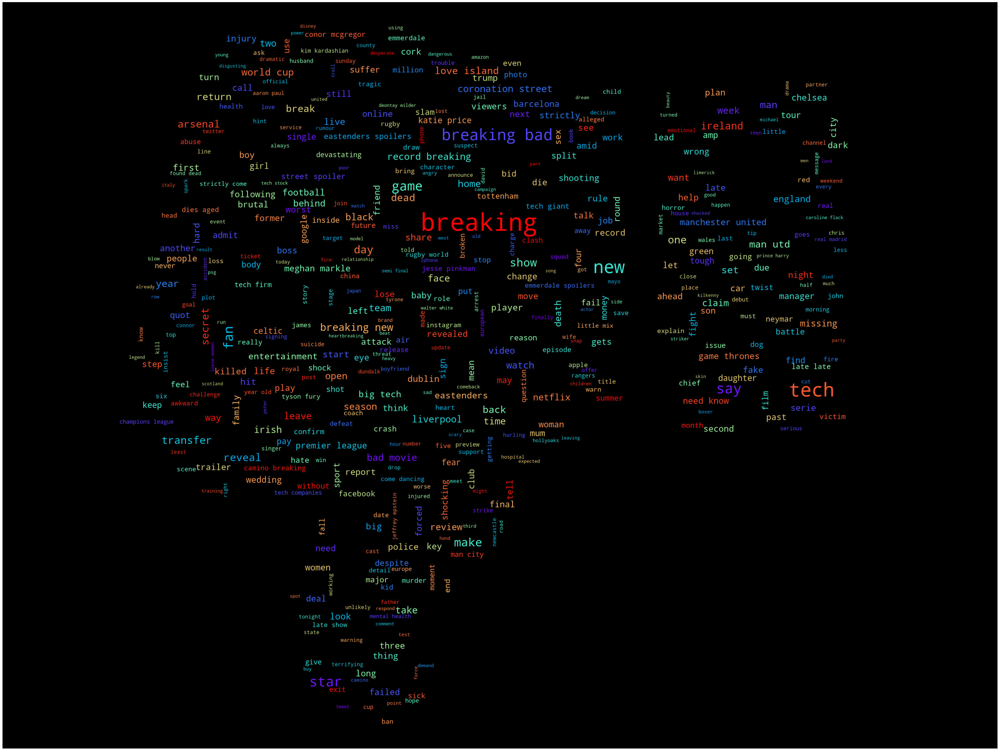

In [229]:
wc(cleaned_data_title_neg,'black','Common Words', mask_neg)

### Comment mask to show most words used in comments

In [230]:
mask_com = np.array(Image.open('comment.png'))

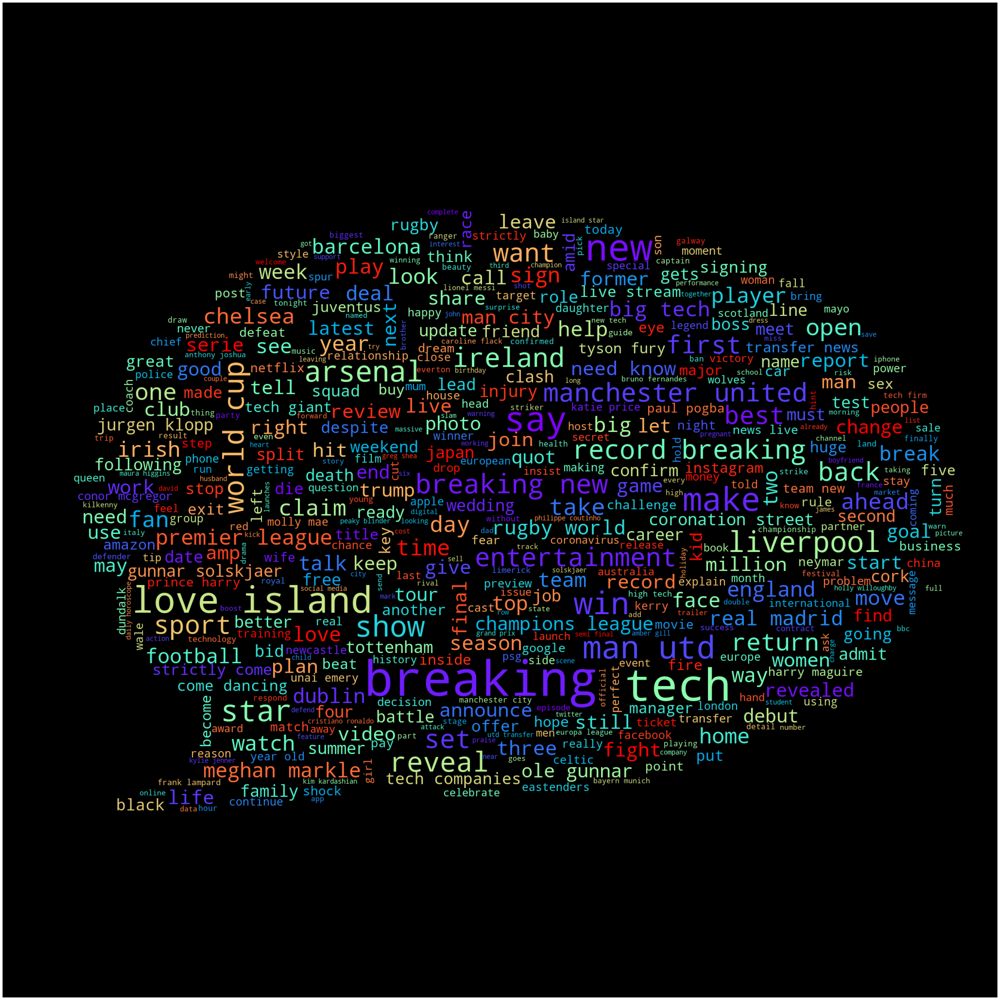

In [238]:
wc(cleaned_data_title_pos,'black','Common Words', mask_com)

### Star mask to show common words in the comments selected as Editor`s pick

In [241]:
mask_star = np.array(Image.open('star.png'))

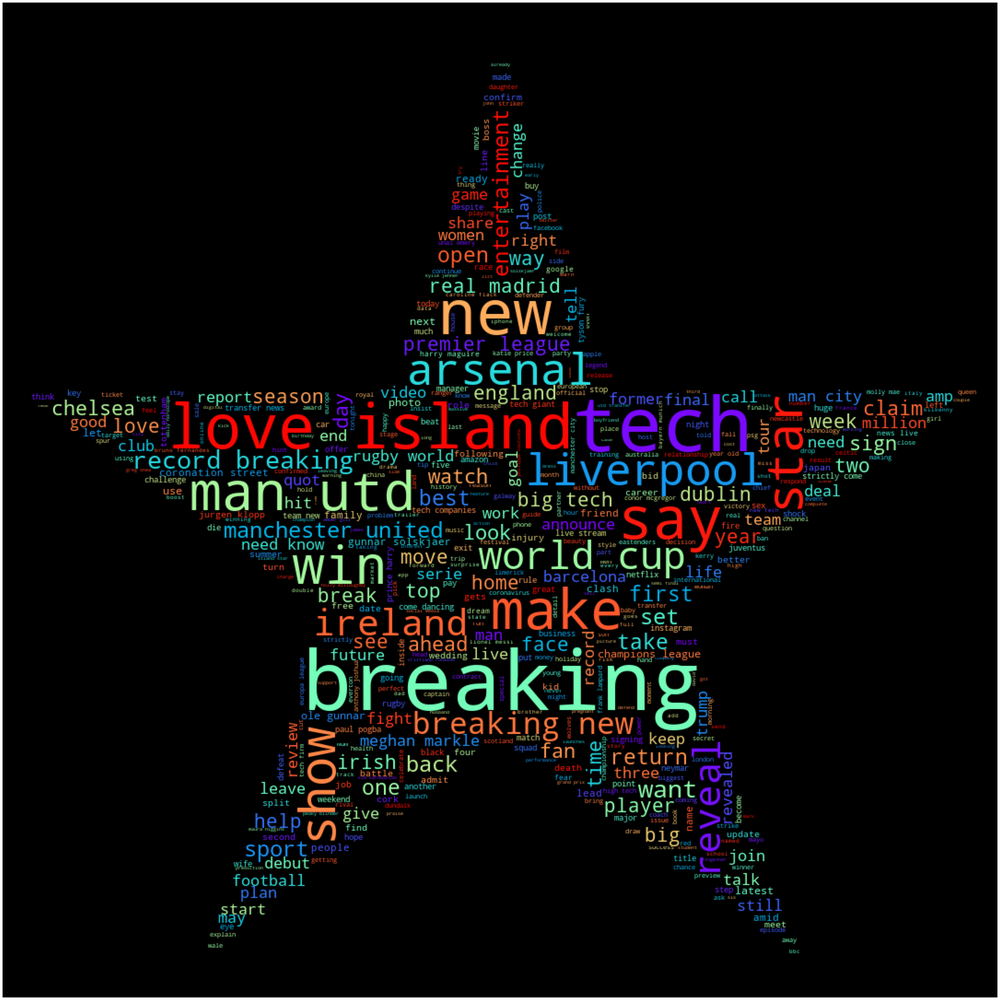

In [242]:
wc(cleaned_data_title_pos,'black','Common Words', mask_star)

### Location mask to show most common locations of the commenters

In this dataset I do not have location, so Iam using few words only to create it.

In [243]:
mask_loc = np.array(Image.open('loc.png'))

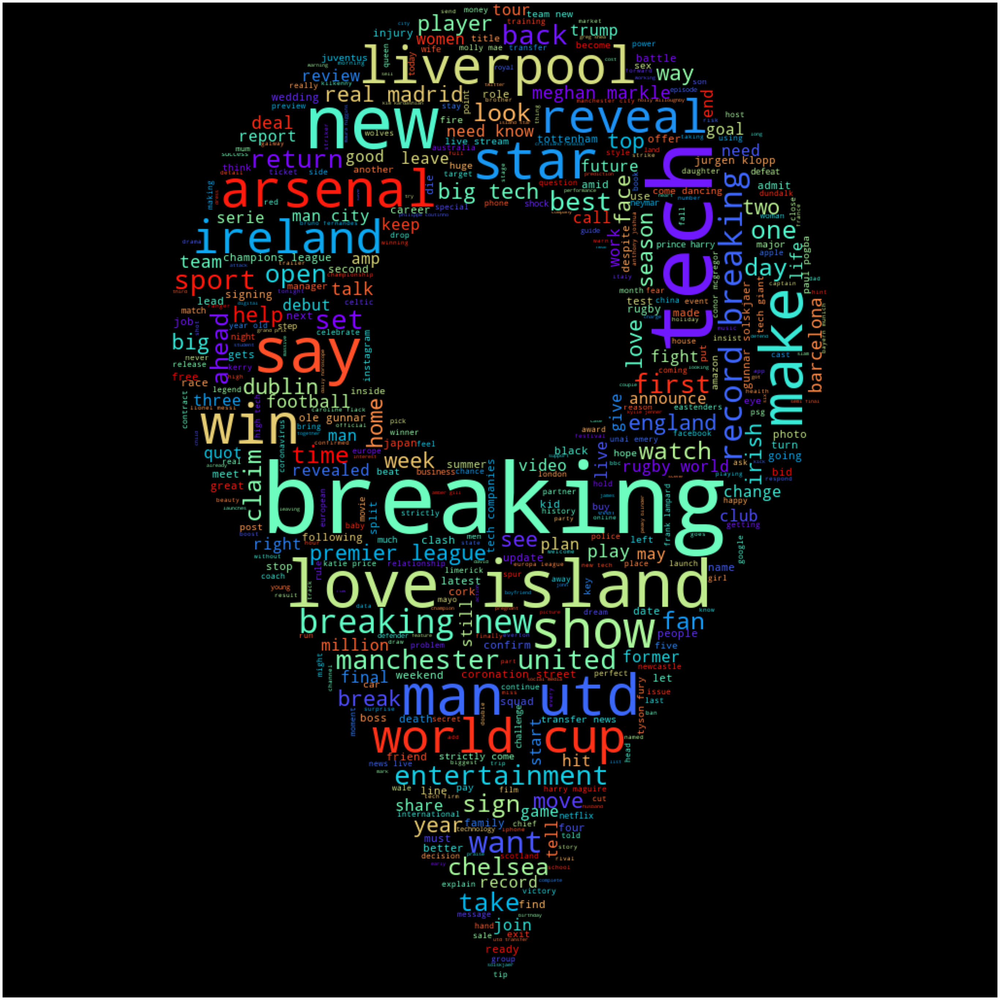

In [244]:
wc(cleaned_data_title_pos,'black','Common Words', mask_loc)

### User mask to show Usernames with most comments

In [245]:
mask_user = np.array(Image.open('user.png'))

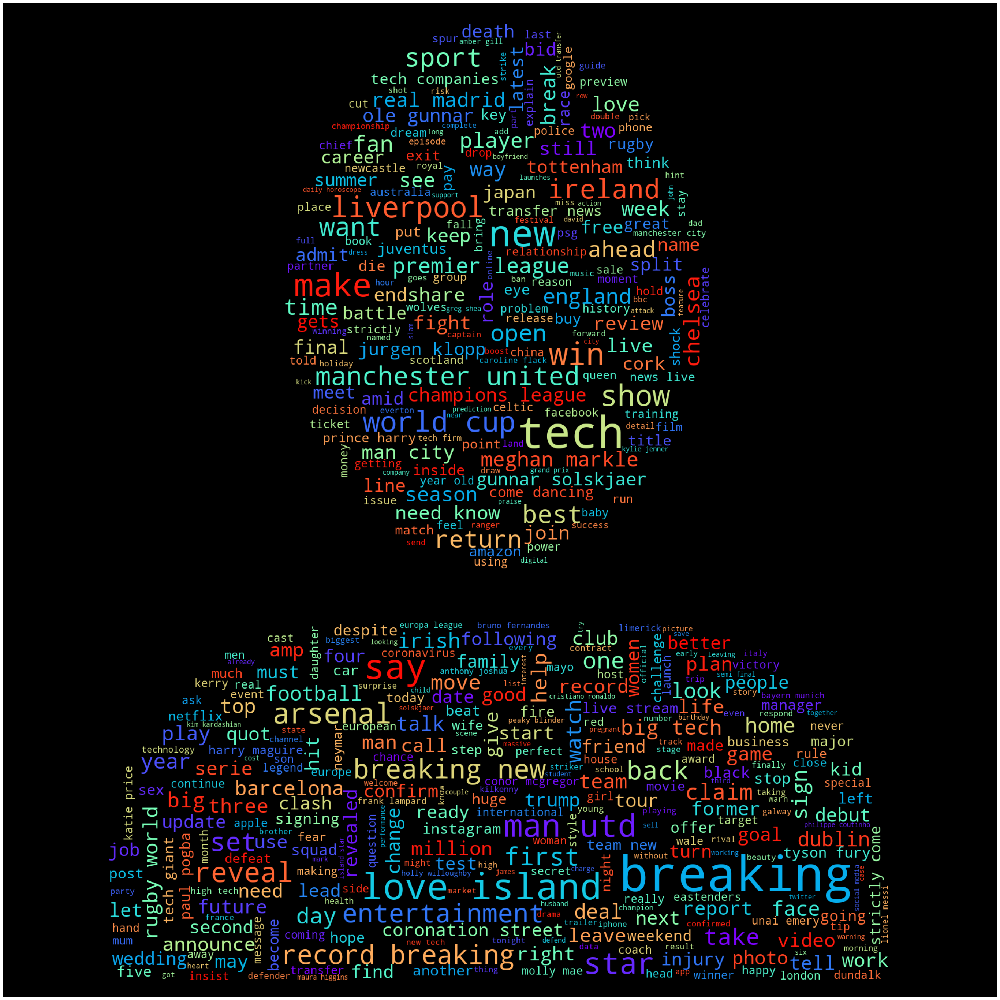

In [246]:
wc(cleaned_data_title_pos,'black','Common Words', mask_user)

## Function to save the image

In [171]:
def wc(data,bgcolor,title, mask):
    plt.figure(figsize = (50,50))
    wc = WordCloud(width = 3000, height = 2000,background_color = bgcolor, max_words = 500,  max_font_size = 100,
                   colormap='rainbow',stopwords=STOPWORDS,mask=mask)
    wc.generate(' '.join(data))
    plt.imshow(wc)
    plt.axis('off')
    plt.savefig('data_ps_white.jpg')